In [2]:
# imports
import os
import sys 
import yaml
import numpy as np
import plotly.express as px
import plotly.io as pio

from console.utilities.io import yaml_loader
from console.pulseq_interpreter.sequence import SequenceProvider


# Plotly configuration
pio.renderers.default = "notebook"

Python Version: 3.10.0 on Windows



c:\Users\schote01\code\spectrum-pulseq\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Unrolling sequnce...


0it [00:00, ?it/s]

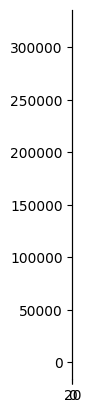

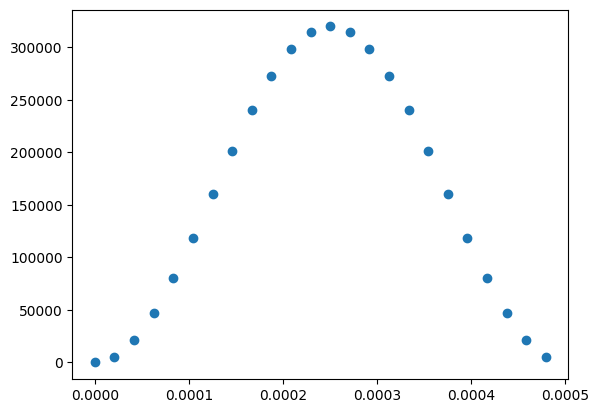

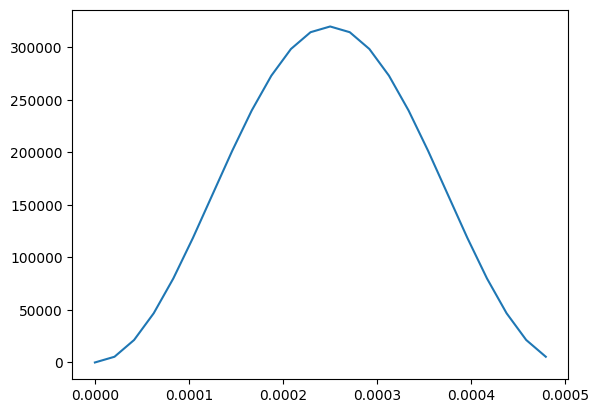

In [6]:
# Define config file path and create sequence provider
config_file = os.path.normpath("/Users/schote01/code/spectrum-pulseq/device_config.yaml")

# Load config
with open(config_file, 'rb') as file:
    config = yaml.load(file, Loader=yaml_loader)

# Get sequence provider
system = config["system"][0]
seq = SequenceProvider(system, raster_time=1e-5)
# Read sequence
seq_path = os.path.normpath("/Users/schote01/code/spectrum-pulseq/examples/pulseq/tse.seq")
seq.read(seq_path)

data = seq.unroll_sequence()

In [4]:
fig = px.line(
    x=data.rf.time_points * 1e6, 
    y=data.rf.waveform, 
    title='RF', 
    labels=dict(x="Time (us)", y="Amplitude")
)
fig.show()

In [5]:
fig = px.line(
    x=data.gx.time_points * 1e6, 
    y=data.gx.waveform, 
    title='GX', 
    labels=dict(x="Time (us)", y="Amplitude")
)
fig.show()